In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from importlib.metadata import version
from typing import Any

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import Image

from src import PROJECT_PATH

pd.set_option("display.max_rows", 1000)
pd.set_option("display.max_columns", 1000)

%config InlineBackend.figure_formats = {"retina", "png"}

pkgs = ["scikit-learn", "numpy", "pandas", "matplotlib", "seaborn"]
for p in pkgs:
    print(f"{p}: v{version(p)}")

scikit-learn: v1.6.1
numpy: v2.1.3
pandas: v2.2.3
matplotlib: v3.10.1
seaborn: v0.13.2


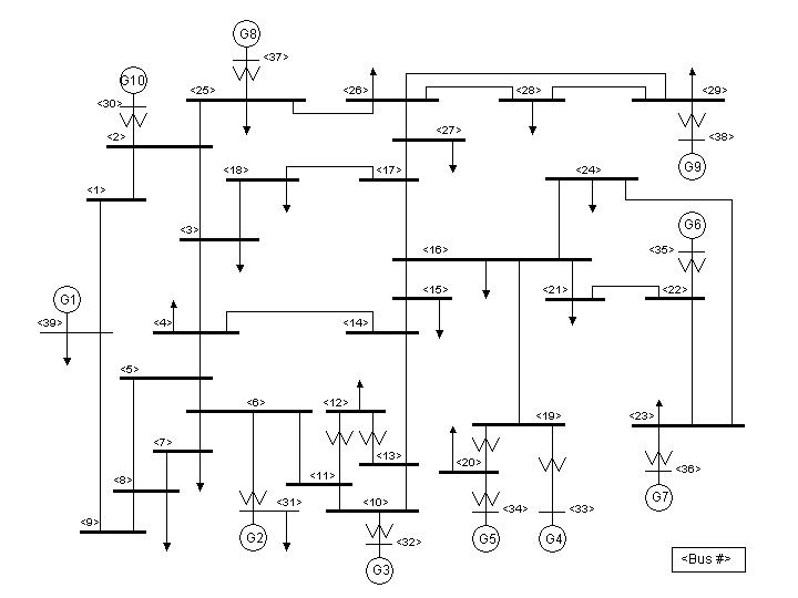

In [ ]:
Image(PROJECT_PATH / "reports" / "figures" / "Bus39.jpg")

In [ ]:
from src import DATA_RAW_PATH

INPUT_PATH = DATA_RAW_PATH / "Results_v2" / "main"
assert INPUT_PATH.exists(), INPUT_PATH

## Grid States (LF)


In [ ]:
# obratovalnega stanja
lf = pd.read_csv(INPUT_PATH / "LF_main.csv", sep=";", decimal=",", index_col=0)

lf.info(max_cols=len(lf.columns))

<class 'pandas.core.frame.DataFrame'>
Index: 21783 entries, 0 to 21782
Data columns (total 221 columns):
 #    Column              Non-Null Count  Dtype  
---   ------              --------------  -----  
 0    U_Bus 01_[pu]       21783 non-null  float64
 1    phi_Bus 01_[deg]    21783 non-null  float64
 2    U_Bus 02_[pu]       21783 non-null  float64
 3    phi_Bus 02_[deg]    21783 non-null  float64
 4    U_Bus 03_[pu]       21783 non-null  float64
 5    phi_Bus 03_[deg]    21783 non-null  float64
 6    U_Bus 04_[pu]       21783 non-null  float64
 7    phi_Bus 04_[deg]    21783 non-null  float64
 8    U_Bus 05_[pu]       21783 non-null  float64
 9    phi_Bus 05_[deg]    21783 non-null  float64
 10   U_Bus 06_[pu]       21783 non-null  float64
 11   phi_Bus 06_[deg]    21783 non-null  float64
 12   U_Bus 07_[pu]       21783 non-null  float64
 13   phi_Bus 07_[deg]    21783 non-null  float64
 14   U_Bus 08_[pu]       21783 non-null  float64
 15   phi_Bus 08_[deg]    21783 non-null  flo

In [ ]:
lf[sorted(lf.columns)].describe().T

,count,mean,std,min,25%,50%,75%,max
P_G 01_[MW],21783.0,775.888382,2.293390e+02,-176.7200,619.65000,776.2100,930.7000,1711.7300
P_G 02_[MW],21783.0,0.000000,0.000000e+00,-0.0000,0.00000,0.0000,0.0000,-0.0000
P_G 03_[MW],21783.0,324.792336,9.785023e+01,-69.9800,257.46500,324.2800,390.7850,714.5300
P_G 04_[MW],21783.0,315.717130,9.516237e+01,-68.6700,250.37000,315.5100,379.6200,670.6000
P_G 05_[MW],21783.0,253.644929,7.875081e+01,-57.4100,199.46500,252.2000,305.9900,595.7500
P_G 06_[MW],21783.0,324.697745,9.782962e+01,-71.4600,257.66500,324.4600,390.4050,689.6400
P_G 07_[MW],21783.0,279.752257,8.443996e+01,-61.1800,221.94500,279.7200,337.0000,612.2000
P_G 08_[MW],21783.0,269.672704,8.147833e+01,-59.6400,213.79000,268.6200,325.0650,578.2700
P_G 09_[MW],21783.0,414.785905,1.247794e+02,-92.0100,329.91500,414.2600,498.1000,883.8600
P_G 10_[MW],21783.0,124.874655,3.867778e+01,-26.3700,98.10000,124.4600,150.3200,287.5000


## Frequency Stability (FSA)


In [ ]:
# indeksi frekvenčne stabilnosti
fsa = pd.read_csv(INPUT_PATH / "FSA_main.csv", sep=";", decimal=",", index_col=0)

fsa.info(max_cols=len(fsa.columns))

<class 'pandas.core.frame.DataFrame'>
Index: 21783 entries, 0 to 21782
Data columns (total 60 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   minF_0      21783 non-null  float64
 1   maxF_0      21783 non-null  float64
 2   maxRoCoF_0  21783 non-null  float64
 3   M1_0        21783 non-null  float64
 4   M2_0        21783 non-null  float64
 5   M3_0        21783 non-null  float64
 6   minF_1      21783 non-null  float64
 7   maxF_1      21783 non-null  float64
 8   maxRoCoF_1  21783 non-null  float64
 9   M1_1        21783 non-null  float64
 10  M2_1        21783 non-null  float64
 11  M3_1        21783 non-null  float64
 12  minF_2      21783 non-null  float64
 13  maxF_2      21783 non-null  float64
 14  maxRoCoF_2  21783 non-null  float64
 15  M1_2        21783 non-null  float64
 16  M2_2        21783 non-null  float64
 17  M3_2        21783 non-null  float64
 18  minF_3      21783 non-null  float64
 19  maxF_3      21783 non-null  fl

In [ ]:
fsa[sorted(fsa.columns)].describe().T

,count,mean,std,min,25%,50%,75%,max
M1_0,21783.0,2.529130e-02,1.184384e+00,0.000000e+00,0.00030,0.0007,0.00140,1.000000e+02
M1_1,21783.0,9.996048e+01,1.944334e+00,1.686000e+00,100.00000,100.0000,100.00000,1.000000e+02
M1_2,21783.0,9.087851e-01,2.932991e+00,0.000000e+00,0.00130,0.3511,1.49455,1.000000e+02
M1_3,21783.0,4.279363e-01,2.077447e+00,0.000000e+00,0.00110,0.1461,0.69075,1.000000e+02
M1_4,21783.0,7.956653e-01,2.560105e+00,0.000000e+00,0.56100,0.6813,0.87160,1.000000e+02
M1_5,21783.0,4.727199e-01,2.203357e+00,0.000000e+00,0.00100,0.0624,0.78310,1.000000e+02
M1_6,21783.0,6.802673e-01,2.301525e+00,0.000000e+00,0.00430,0.7195,0.90520,1.000000e+02
M1_7,21783.0,1.111140e+00,3.029322e+00,0.000000e+00,0.31830,1.1141,1.39895,1.000000e+02
M1_8,21783.0,1.742696e-01,1.253224e+00,0.000000e+00,0.00040,0.0010,0.00260,1.000000e+02
M1_9,21783.0,2.744450e+00,6.296758e+00,3.300000e-03,1.78015,2.1037,2.62625,1.000000e+02


## Small Signal Stability Analysis (SSSA) data


In [ ]:
# stabilnost za majhne motnje
sssa = pd.read_csv(INPUT_PATH / "SSSA_main.csv", sep=";", decimal=",", index_col=0)

sssa.info(max_cols=len(sssa.columns))

<class 'pandas.core.frame.DataFrame'>
Index: 21783 entries, 0 to 21782
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   RealPartMode_0  21783 non-null  float64
 1   ImagPartMode_0  21783 non-null  float64
 2   RealPartMode_1  21783 non-null  float64
 3   ImagPartMode_1  21783 non-null  float64
 4   RealPartMode_2  21783 non-null  float64
 5   ImagPartMode_2  21783 non-null  float64
 6   RealPartMode_3  21783 non-null  float64
 7   ImagPartMode_3  21783 non-null  float64
 8   RealPartMode_4  21783 non-null  float64
 9   ImagPartMode_4  21783 non-null  float64
 10  RealPartMode_5  21783 non-null  float64
 11  ImagPartMode_5  21783 non-null  float64
 12  RealPartMode_6  21783 non-null  float64
 13  ImagPartMode_6  21783 non-null  float64
 14  RealPartMode_7  21783 non-null  float64
 15  ImagPartMode_7  21783 non-null  float64
 16  RealPartMode_8  21783 non-null  float64
 17  ImagPartMode_8  21783 non-null  floa

In [ ]:
sssa[sorted(sssa.columns)].describe().T

,count,mean,std,min,25%,50%,75%,max
ImagPartMode_0,21783.0,4.323219,0.301322,4.102532,4.281885,4.297610,4.304625,6.962788
ImagPartMode_1,21783.0,6.911375,0.315962,3.993997,6.938657,6.948769,6.957408,7.032577
ImagPartMode_2,21783.0,6.459483,0.118938,4.991241,6.454807,6.489976,6.505477,6.542905
ImagPartMode_3,21783.0,5.480582,0.132791,5.100804,5.402520,5.479807,5.552012,7.202125
ImagPartMode_4,21783.0,6.939710,0.176988,5.481042,6.843943,6.971710,7.068167,7.229660
ImagPartMode_5,21783.0,7.163646,0.295619,5.651895,7.084694,7.258839,7.348455,8.753133
ImagPartMode_6,21783.0,7.946116,0.439974,6.566677,7.652382,7.969976,8.280844,8.997088
ImagPartMode_7,21783.0,8.215223,0.429078,6.897424,7.920725,8.286327,8.580192,9.019278
ImagPartMode_8,21783.0,8.247298,0.381875,7.099863,8.110727,8.325379,8.480591,9.155399
RealPartMode_0,21783.0,-0.229964,0.018976,-0.333656,-0.238455,-0.223489,-0.216234,-0.200249


## Transient Stability Analysis (TSA) data


In [ ]:
# indeksi tranzientne stabilnosti
tsa = pd.read_csv(INPUT_PATH / "TSA_main.csv", sep=";", decimal=",", index_col=0)

tsa.info(max_cols=len(tsa.columns))

/tmp/ipykernel_1766159/213289469.py:2: DtypeWarning: Columns (292,293,294,295) have mixed types. Specify dtype option on import or set low_memory=False.
  tsa = pd.read_csv(INPUT_PATH / "TSA_main.csv", sep=";", decimal=",", index_col=0)


<class 'pandas.core.frame.DataFrame'>
Index: 21783 entries, 0 to 21782
Data columns (total 295 columns):
 #    Column       Non-Null Count  Dtype  
---   ------       --------------  -----  
 0    CCT_0        21783 non-null  float64
 1    Terminal_0   21783 non-null  object 
 2    Crit_gen_0   21783 non-null  object 
 3    Type_0       21783 non-null  int64  
 4    Location_0   21783 non-null  object 
 5    CCT_1        21778 non-null  float64
 6    Terminal_1   21778 non-null  object 
 7    Crit_gen_1   21778 non-null  object 
 8    Type_1       21778 non-null  object 
 9    Location_1   21778 non-null  object 
 10   CCT_2        21770 non-null  float64
 11   Terminal_2   21770 non-null  object 
 12   Crit_gen_2   21770 non-null  object 
 13   Type_2       21770 non-null  object 
 14   Location_2   21770 non-null  object 
 15   CCT_3        21769 non-null  float64
 16   Terminal_3   21769 non-null  object 
 17   Crit_gen_3   21769 non-null  object 
 18   Type_3       21769 non-null  

In [ ]:
tsa[sorted(tsa.columns)].describe().T

,count,mean,std,min,25%,50%,75%,max
CCT_0,21783.0,0.431943,0.137345,0.17,0.34,0.41,0.49,1.92
CCT_1,21778.0,0.428950,0.143403,0.15,0.33,0.40,0.49,1.88
CCT_10,21759.0,0.533578,0.165771,0.21,0.44,0.51,0.58,1.96
CCT_11,21757.0,0.513526,0.121349,0.21,0.45,0.51,0.58,1.92
CCT_12,21756.0,0.562563,0.146563,0.22,0.47,0.55,0.64,1.67
CCT_13,21754.0,0.554322,0.107988,0.24,0.48,0.56,0.61,1.90
CCT_14,21751.0,0.593820,0.136675,0.23,0.51,0.60,0.67,1.96
CCT_15,21711.0,0.575431,0.139830,0.24,0.50,0.57,0.63,1.93
CCT_16,21667.0,0.632450,0.269699,0.17,0.46,0.51,0.79,1.95
CCT_17,21603.0,0.678446,0.298175,0.06,0.48,0.55,0.86,1.96


In [ ]:
# Problematične vrstice
tsa[sorted(tsa.columns)].loc[290:296].T

,290,291,292,293,294,295,296
CCT_0,0.45,0.36,0.42,0.38,0.32,0.38,0.38
CCT_1,0.45,0.35,0.41,0.37,0.31,0.37,0.37
CCT_10,0.59,0.46,0.55,0.49,0.41,0.49,0.48
CCT_11,0.6,0.47,0.55,0.5,0.42,0.5,0.49
CCT_12,0.65,0.5,0.59,0.54,0.44,0.54,0.52
CCT_13,0.66,0.58,0.6,0.64,0.51,0.65,0.63
CCT_14,0.73,0.64,0.66,0.72,0.55,0.73,0.69
CCT_15,0.7,0.59,0.63,0.65,0.51,0.66,0.64
CCT_16,1.5,0.5,1.03,0.54,0.44,0.54,0.53
CCT_17,1.59,0.54,1.04,0.58,0.47,0.58,0.58


## Correlation Analysis


In [ ]:
def plot_correlations(raw: pd.DataFrame, feature_cols: list[str], target_cols: list[str]):
    # pick only numerical feature columns and remove constant columns
    num_features_cols = lf[feature_cols].select_dtypes(include=np.number).columns
    num_features_cols = [col for col in num_features_cols if len(raw[col].unique()) > 1]
    num_features_cols = sorted(num_features_cols)

    # pick only numerical target columns and remove constant columns
    num_target_cols = raw[target_cols].select_dtypes(include=np.number).columns
    num_target_cols = [col for col in num_target_cols if len(raw[col].unique()) > 1]
    num_target_cols = sorted(num_target_cols)

    print(
        f"(numeric) features: {len(num_features_cols)}/{len(feature_cols)}; "
        f"(numeric) targets: {len(num_target_cols)}/{len(target_cols)}"
    )

    # compute correlation matrix
    corr = raw.select_dtypes(include=np.number).corr(method="spearman")

    # Observe only correlation between features and targets
    corr = corr.loc[num_target_cols, num_features_cols]

    cmap = sns.color_palette("coolwarm", as_cmap=True)

    fig, ax = plt.subplots(figsize=(40, 90), dpi=200)

    style_kwargs: dict[str, Any] = {
        "square": True,
        "linewidths": 0.25,
        "annot": True,
        "annot_kws": {"fontsize": 8},
        "fmt": ".1f",
        "cbar_kws": {"shrink": 0.5},
        "cbar": False,
        "cmap": cmap,
        "vmin": -1,
        "center": 0,
        "vmax": 1,
    }

    ax.set_title("Correlation metric: >>spearman<<")
    sns.heatmap(corr, ax=ax, **style_kwargs)
    plt.show()

In [ ]:
raw = lf.merge(fsa, how="left", left_index=True, right_index=True)
feature_cols = list(lf.columns)
target_cols = list(fsa.columns)

plot_correlations(raw, feature_cols, target_cols)

(numeric) features: 124/221; (numeric) targets: 60/60


(numeric) features: 124/221; (numeric) targets: 18/18


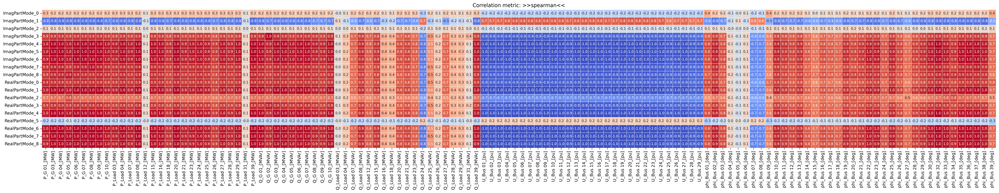

In [ ]:
raw = lf.merge(sssa, how="left", left_index=True, right_index=True)
feature_cols = list(lf.columns)
target_cols = list(sssa.columns)

plot_correlations(raw, feature_cols, target_cols)

In [ ]:
raw = lf.merge(tsa, how="left", left_index=True, right_index=True)
feature_cols = list(lf.columns)
target_cols = list(tsa.columns)

plot_correlations(raw, feature_cols, target_cols)

(numeric) features: 124/221; (numeric) targets: 59/295
